# GANs for Image Generation

Deep neural networks are used mainly for supervised learning classification or regression.

Generative Adversarial Networks or GANs, however, use neural networks for a very different purpose : Generative modelling

Generative modelling is an unsupervised learning task in machine learning that involves automatically discovering and learning the regularities or patterns in input data in such a way that the model can be used to generate or output new examples that plausibly could have been drawn from the original dataset.

While there are many approaches used for generative modelling, a Generative Adversarial Network takes the following approach:

<img src="./images/36364510-6a5329fe-157f-11e8-81b3-ee3a7d5d8d48.jpg">

There are two neural networks : a generator and a discriminator.

The generator generates a "fake" sample given a random vector/matrix, and the discriminator attempts to detct whether a given sample is "real" (picked from the training data) or "fake" (generated by the generator).

Training happens in tandem : we train the discriminator for a few epochs, then train the generator for a few epochs, and repeat.

This way both the generator and the discriminator get better at doing their jobs.

GANs, however, can be notoriously difficult to train, and are extremely sensitive to hyperparameters, activation functions and regularization.

In this notebook, we'll train a GAN to generate images of anime characters' faces.

We'll use the Anime Face Dataset, which consists of over 63,000 cropped anime faces.

Note that generative modelling is an unsupervised learning task, so the images do not have any labels.

# Loading the Data

In [117]:
data_dir = './images'

# Exploring the data

In [118]:
import os

print(os.listdir(data_dir))

['0rs9l.gif', '0_-SwM1XOPnrx2OKxN.png', '0_La9_J7dqnk-DEWyb.gif', '36364510-6a5329fe-157f-11e8-81b3-ee3a7d5d8d48.jpg', 'anime face dataset', 'Binary_Cross-Entropy___Log_Loss.png', 'Data_Augmentation_6e40cf9074.png', 'Generator-network-architecture.png', 'image-1150x639.png', 'overfitting.jpg', 'ReLu-vs-Leaky-ReLu-nonlinear-activation-functions.png', 'ResBlock.png', 'RGB-CNN.png', 'Screenshot-2019-07-21-at-2.57.13-AM.png', 'tanH.png', 'Typical-training-loop-for-GANs.png', 'UG_CNN_scheme.png']


In [119]:
print(os.listdir(data_dir+'/anime face dataset')[:10])

['0_2000.jpg', '10000_2004.jpg', '10001_2004.jpg', '10002_2004.jpg', '10003_2004.jpg', '10004_2004.jpg', '10005_2004.jpg', '10006_2004.jpg', '10007_2004.jpg', '10008_2004.jpg']


Let's load this dataset using the ImageFolder class from torchvision.

We will also resize and crop the images to 64x64 px, and normalize the pixel values with a mean and standard deviation of 0.5 for each channel.

This will ensure that pixel values are in the range (-1, 1), which is more convenient for training the discriminator.

Creating a data loader to load the data in batches.

In [120]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [121]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [122]:
from torch.utils.data import Dataset
from PIL import Image
import os

class AnimeFaceDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image  # No label

# Usage
transform = T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)
])

train_ds = AnimeFaceDataset('./images/anime face dataset', transform=transform)
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)

Let's create helper functions to denormalize the image tensors and display some sample some sample images from a training batch.

In [123]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [124]:
def denorm(img_tensors):
    mean = torch.tensor(stats[0]).view(3, 1, 1).to(img_tensors.device)
    std = torch.tensor(stats[1]).view(3, 1, 1).to(img_tensors.device)
    return img_tensors * std + mean

In [125]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))  # Adjust size as needed
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images in dl:
        show_images(images, nmax)
        break

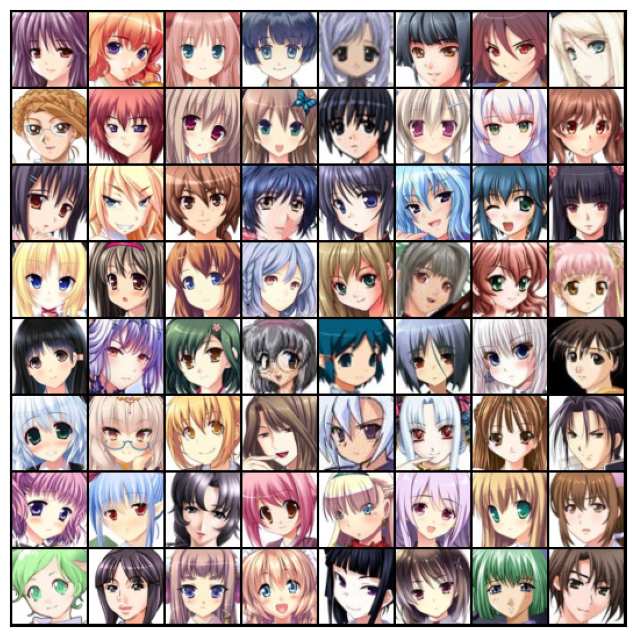

In [126]:
show_batch(train_dl)

# Using a GPU

To seamlessly use a GPU, if one is avaliable, we define of helper functions [get_default_device and to_device] and a helper class DeviceDataLoader to move our model and data to the GPU, if one is avaliable.

In [127]:
def get_default_device():
    # Pick GPU if avaliable, else CPU
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    # Move tensor(s) to chosen device
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    # Wrap a dataloader to move data to a device
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        # Yield a batch of data after moving it to device
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        # Number of batches
        return len(self.dl)

In [128]:
device = get_default_device()
device

device(type='cuda')

In [129]:
train_dl = DeviceDataLoader(train_dl, device)

# Discriminator Network

The discriminator takes an image an input, and tries to classify it as "real" or "generated".

In this sense, it's like any other neural network.

We'll use a convolutional neural network (CNN) which outputs a single number output for every image.

We'll use stride of 2 to progressively reduce the size of the output feature map.

<img src="./images/image-1150x639.png">

In [130]:
import torch.nn as nn

In [131]:
discriminator = nn.Sequential(
    # in : 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out : 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out : 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out : 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out : 512 x 4 x 4
    
    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out : 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)

## 🔧 What is `BatchNorm2d`?

**Batch Normalization (2D)** is like a smart filter that keeps the values flowing through your network **balanced and stable**.

### 🧠 Simple Explanation:
- It **normalizes** the output of a convolution layer — meaning it adjusts the values so they’re not too big or too small.
- This helps the model **train faster** and **avoid exploding or vanishing gradients**.

### 🧼 Analogy:
Imagine you're baking cookies and each batch comes out with wildly different sizes. BatchNorm is like a cookie cutter that ensures every batch is consistent — not too flat, not too puffy.

---

## ⚡ What is `LeakyReLU`?

**Leaky ReLU** is a type of activation function — it decides which signals get passed forward.

### 🧠 Simple Explanation:
- Regular ReLU blocks all negative values (sets them to zero).
- **Leaky ReLU** lets a **small negative slope** through (like 0.2 × x), so the network doesn’t go completely silent when values are negative.

### 🧼 Analogy:
Think of it like a door that’s mostly closed to negative values but still lets a tiny breeze through — just enough to keep things moving.

---

## 🧱 Full Discriminator Architecture Explained

This is a **Convolutional Neural Network (CNN)** used in **GANs** to tell if an image is real or fake.

### 🔄 Input:
- A 3-channel image of size **64×64** (like a colored anime face).

---

### 🧩 Layer-by-Layer Breakdown:

| Layer | Operation | Output Size | Purpose |
|-------|-----------|-------------|---------|
| 1 | `Conv2d(3, 64)` | 64×32×32 | Extract basic features |
| 2 | `BatchNorm2d(64)` | 64×32×32 | Normalize activations |
| 3 | `LeakyReLU(0.2)` | 64×32×32 | Add non-linearity |

Then repeat this pattern with increasing depth:

- `Conv2d(64 → 128)` → 128×16×16
- `Conv2d(128 → 256)` → 256×8×8
- `Conv2d(256 → 512)` → 512×4×4

Each time:
- You **halve the spatial size** (due to stride=2).
- You **double the number of channels** (more abstract features).

---

### 🎯 Final Layers:

- `Conv2d(512 → 1)` → 1×1×1  
  → Compress all features into a single value.
- `Flatten()` → Converts 1×1×1 into a scalar.
- `Sigmoid()` → Outputs a probability between 0 and 1  
  → **1 = real**, **0 = fake**

---

### 🧠 Summary

This discriminator:
- Gradually compresses the image while extracting deeper features.
- Uses **BatchNorm** to stabilize training.
- Uses **LeakyReLU** to keep gradients flowing.
- Ends with a **Sigmoid** to classify the image as real or fake.


Note that we're using the Leaky ReLU activation for the discriminator.

<img src="./images/ReLu-vs-Leaky-ReLu-nonlinear-activation-functions.png">

Different from the regular ReLU function, Leaky ReLU allows the pass of a small gradient signal for negative values.

As a result, it makes the gradients from the discriminator flows stronger into the generator.

Instead of passing a gradient (slope) of 0 in the back-prop pass, a passes a small negative gradient.

Just like any other binary classification model, the output of the discriminator is a single number between 0 and 1, which can be interpreted as the probability of the input image being real i.e. picked from the original dataset.

Let's move the discriminator model to the chosen device.

In [132]:
discriminator = to_device(discriminator, device)

# Generator Network

The input to the generator is typically a vector or a matrix of random numbers (referred to as latent tensor) which is used as a seed for generating an image.

The generator will convert a latent tensor of shape (128, 1, 1) into an image tensor of shape 3 x 28 x 28.

To active this, we'll use the ConvTranspose2d layer from PyTorch, which is performs to as a transposed convolution (also referred to as a deconvolution).

<img src="./images/Generator-network-architecture.png">

In [133]:
latent_size = 128

In [134]:
generator = nn.Sequential(
    # in : latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out : 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out : 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out : 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out : 64 x 32 x 32 
    
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out : 3 x 64 x 64
)

## 🔄 What is `ConvTranspose2d`?

**ConvTranspose2d** is the opposite of a regular convolution. Instead of shrinking an image, it **expands** it — like zooming in or “undoing” compression.

### 🧠 Simple Explanation:
- Regular `Conv2d` → makes images **smaller** (used in discriminators).
- `ConvTranspose2d` → makes images **larger** (used in generators).

### 🧼 Analogy:
Imagine you’re baking a cookie and pressing it with a mold (Conv2d).  
Now imagine you want to **inflate** that cookie back to its original dough shape — that’s `ConvTranspose2d`.

---

## 🧱 What This Code Builds

This is a **generator network** — it takes a small random noise vector and turns it into a full image (like a 64×64 anime face).

---

### 🔄 Input

- Starts with a **latent vector** of shape `latent_size × 1 × 1` — a tiny blob of random noise.

---

### 🧩 Layer-by-Layer Breakdown

| Layer | Operation | Output Size | Purpose |
|-------|-----------|-------------|---------|
| 1 | `ConvTranspose2d(latent_size → 512)` | 512×4×4 | Start expanding from noise |
| 2 | `BatchNorm2d(512)` | 512×4×4 | Normalize activations |
| 3 | `ReLU()` | 512×4×4 | Add non-linearity |

Then repeat this pattern:

- `512 → 256` → 8×8
- `256 → 128` → 16×16
- `128 → 64` → 32×32

Each time:
- The image gets **larger** (due to stride=2).
- The number of channels gets **smaller** (more refined features).

---

### 🎨 Final Layers

- `ConvTranspose2d(64 → 3)` → 3×64×64  
  → Converts feature map into a 3-channel image (RGB).
- `Tanh()` → Scales pixel values to range [-1, 1]  
  → Matches the normalization used during training.

---

### 🧠 Summary

This generator:
- Starts with a tiny noise vector.
- Uses `ConvTranspose2d` to **grow** it into a full image.
- Uses `BatchNorm` to stabilize training.
- Uses `ReLU` and `LeakyReLU` to keep gradients flowing.
- Ends with `Tanh` to produce a clean, normalized image.

We use the TanH activation function for the output layer of the generator.

<img src="./images/tanH.png">

### 🔢 What is `tanh`?

**`tanh`** stands for **hyperbolic tangent**. It’s a mathematical function used in neural networks to **squash values** into a specific range:

```python
tanh(x) → between -1 and +1
```

So no matter how big or small the input is, the output will always stay between **-1 and 1**.

---

### 🧠 Why is `tanh` useful?

- It helps keep numbers **stable** during training.
- It makes the network **sensitive to both positive and negative signals**.
- It’s smoother than ReLU and works well when you want **balanced outputs** (like images with both dark and light areas).

---

### 🧼 Simple Analogy

Imagine you’re adjusting the volume on a speaker:
- If the input is too loud (positive), `tanh` gently caps it at +1.
- If it’s too quiet (negative), it boosts it up to -1.
- If it’s just right (zero), it stays at 0.

So it’s like a smart volume knob that keeps everything in a comfortable range.

---

### 📊 Visual Intuition

- Inputs near **0** → output is also near **0**
- Inputs far from **0** → output flattens out near **-1 or +1**
- It’s **S-shaped**, smooth, and symmetric around zero.

torch.Size([128, 3, 64, 64])


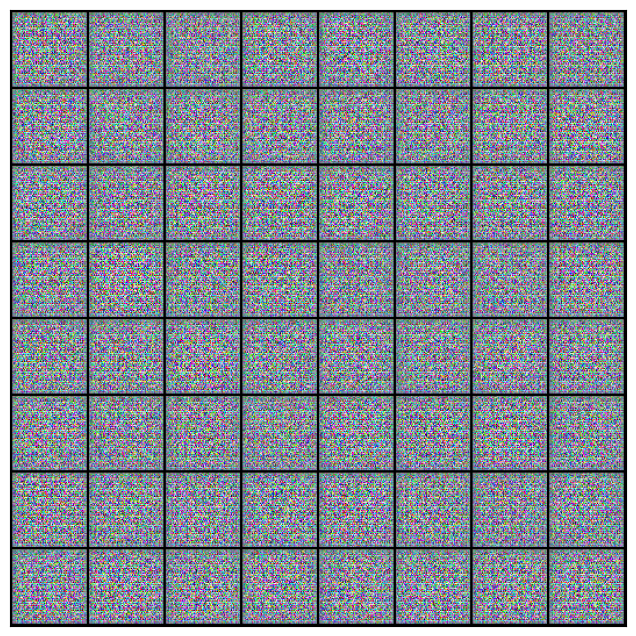

In [135]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)


As one might expect, the output from the generator is basically random noise, since we haven't trained it yet.

In [136]:
generator = to_device(generator, device)

# Discriminator Training

Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

<img src="./images/Binary_Cross-Entropy___Log_Loss.png">

In [137]:
import torch.nn.functional as F

def train_discriminator(real_images, discriminator, generator, opt_d, batch_size, latent_size, device):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Real images
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    fake_preds = discriminator(fake_images)
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Backprop and update
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()

    return loss.item(), real_score, fake_score

# Generator Training

In [138]:
def train_generator(discriminator, generator, opt_g, batch_size, latent_size, device):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Backprop and update
    loss.backward()
    opt_g.step()

    return loss.item()

In [139]:
from torchvision.utils import save_image

In [140]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [141]:
def save_samples(index, latent_tensors, generator, sample_dir='generated', show=True):
    os.makedirs(sample_dir, exist_ok=True)
    fake_images = generator(latent_tensors)

    # Save image grid
    fake_fname = f'generated-images-{index:04d}.png'
    save_path = os.path.join(sample_dir, fake_fname)
    save_image(denorm(fake_images), save_path, nrow=8)
    print('Saving', fake_fname)

    # Optionally show image grid
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(denorm(fake_images).cpu().detach(), nrow=8).permute(1, 2, 0))

Saving generated-images-0000.png


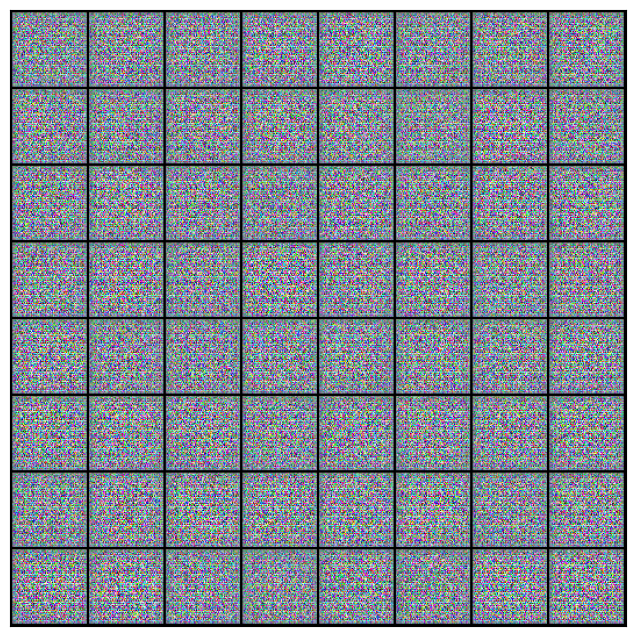

In [142]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)
save_samples(0, fixed_latent, generator)

# Full Training Loop

Let's define a fit function to train the discriminator and generator in tandem for each batch of training data.

We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs.

We will also save some sample generated images at regular intervals for inspection.

<img src="./images/Typical-training-loop-for-GANs.png">

In [143]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [147]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses and scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(start_idx, start_idx + epochs):
        for real_images in tqdm(train_dl):
            real_images = real_images.to(device)

            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(
                real_images, discriminator, generator, opt_d, batch_size, latent_size, device
            )

            # Train generator
            loss_g = train_generator(
                discriminator, generator, opt_g, batch_size, latent_size, device
            )

        # Record losses and scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses and scores
        print(f"Epoch [{epoch}/{start_idx + epochs - 1}], "
              f"loss_g: {loss_g:.4f}, loss_d: {loss_d:.4f}, "
              f"real_score: {real_score:.4f}, fake_score: {fake_score:.4f}")

        # Save generated samples
        save_samples(epoch, fixed_latent, generator)

    return losses_g, losses_d, real_scores, fake_scores

In [148]:
lr = 0.0002
epochs = 5

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/5], loss_g: 3.2378, loss_d: 0.1644, real_score: 0.9017, fake_score: 0.0390
Saving generated-images-0001.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/5], loss_g: 6.0867, loss_d: 0.3962, real_score: 0.8432, fake_score: 0.1511
Saving generated-images-0002.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/5], loss_g: 7.9692, loss_d: 0.3699, real_score: 0.9657, fake_score: 0.2476
Saving generated-images-0003.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/5], loss_g: 5.4048, loss_d: 0.1188, real_score: 0.9706, fake_score: 0.0777
Saving generated-images-0004.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/5], loss_g: 5.5006, loss_d: 0.0812, real_score: 0.9583, fake_score: 0.0337
Saving generated-images-0005.png


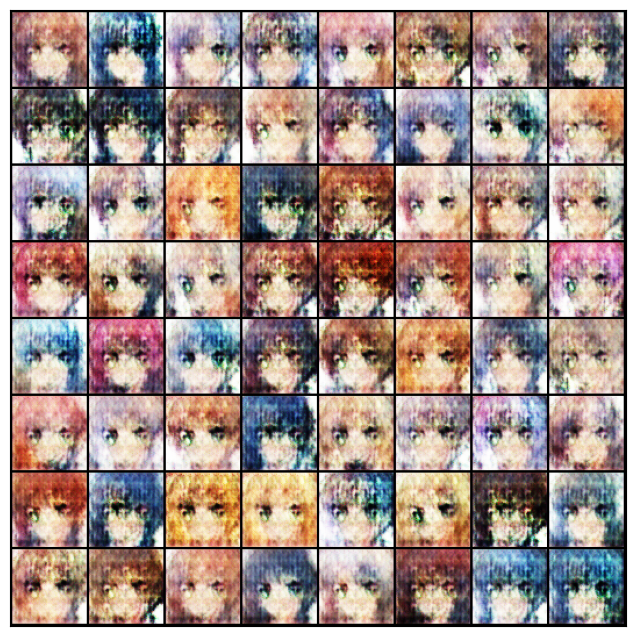

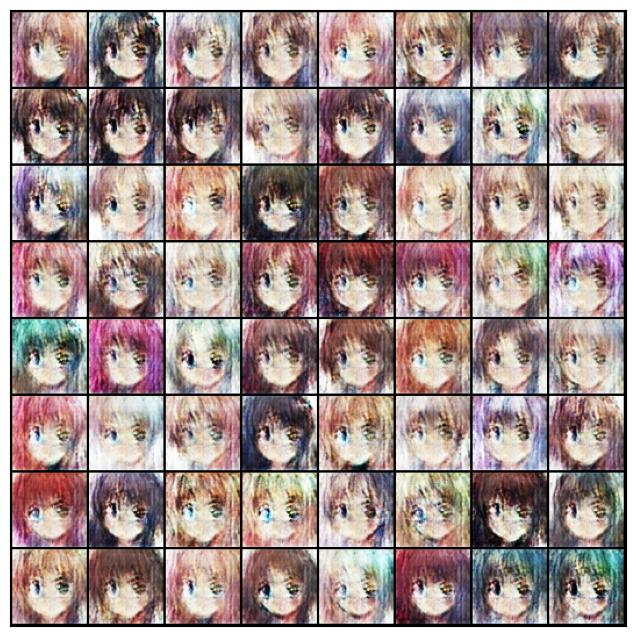

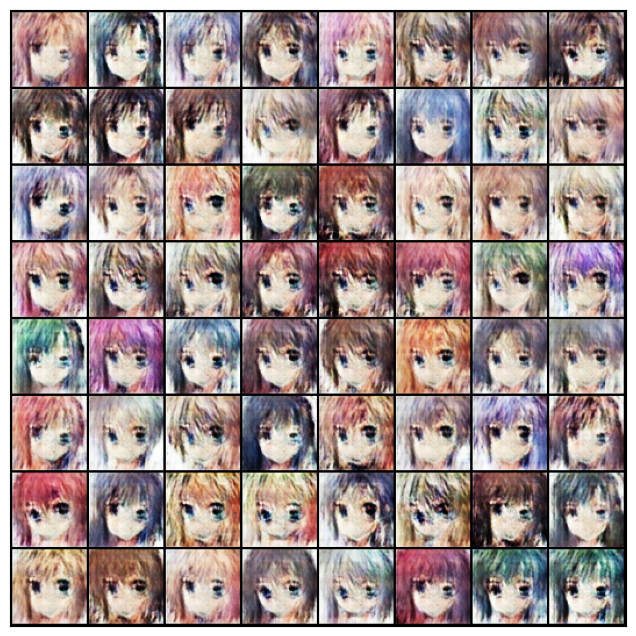

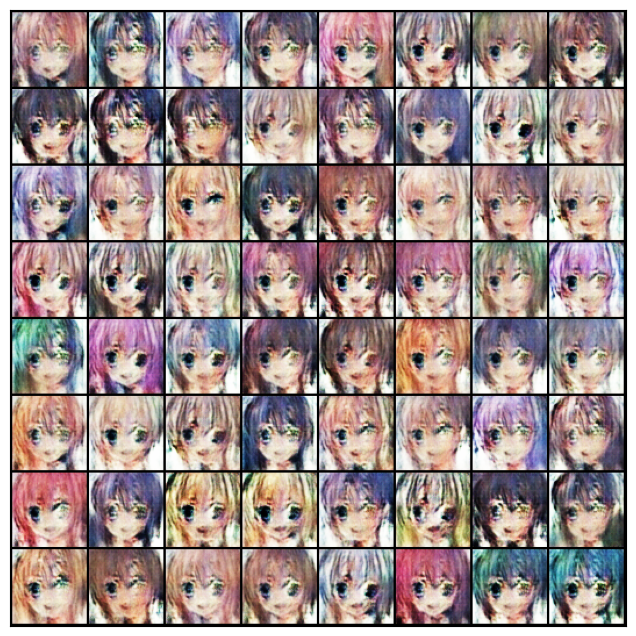

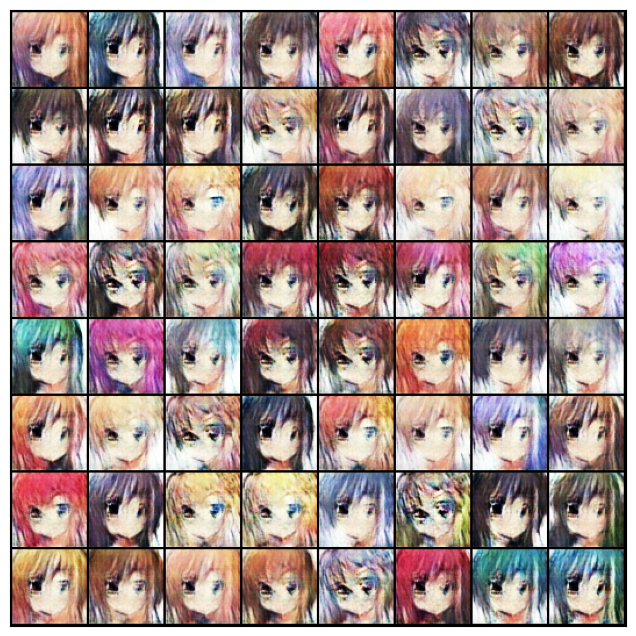

In [149]:
history = fit(epochs, lr)

In [150]:
losses_g, losses_d, real_scores, fake_scores = history

In [151]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.ckpt')
torch.save(discriminator.state_dict(), 'D.ckpt')

We can visualize the training process by combining the sample images generated after each epoch into a video using OpenCV.

In [155]:
import cv2
import os

vid_fname = 'gans_training.avi'

# Collect and sort image files
files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

# Define video writer
fourcc = cv2.VideoWriter_fourcc(*'MP4V')  # Correct codec name
out = cv2.VideoWriter(vid_fname, fourcc, 1, (530, 530))  # 1 fps, 530x530 resolution

# Write frames
for fname in files:
    frame = cv2.imread(fname)
    if frame is not None:
        out.write(frame)

out.release()
print(f"Video saved as {vid_fname}")

Video saved as gans_training.avi


Text(0.5, 1.0, 'Losses')

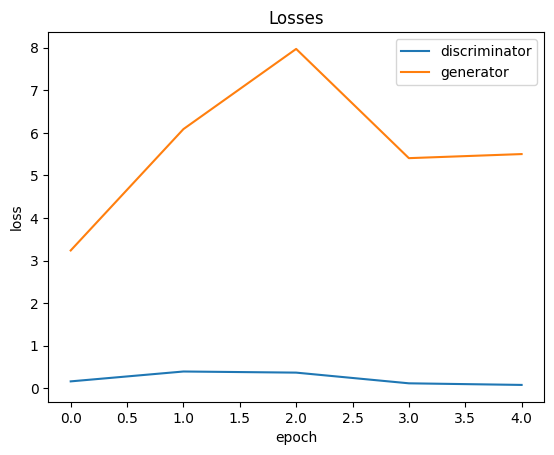

In [156]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['discriminator', 'generator'])
plt.title('Losses')

Text(0.5, 1.0, 'Scores')

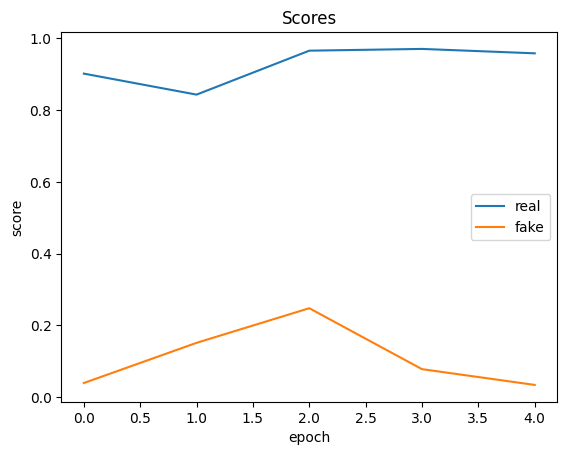

In [157]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['real', 'fake'])
plt.title('Scores')